## Imports and loading the dataset 

In [2]:
# IMPORTING REQUIRED LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import pylab
import pickle, joblib
import sweetviz as sv
import dtale 
import os
#from pandasgui import show
from dataprep.eda import create_report
# from pandas_profiling import ProfileReport 
from feature_engine.outliers import Winsorizer
from feature_engine import transformation
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, train_test_split
from sqlalchemy import create_engine, text
from urllib.parse import quote 
from sklearn.metrics import accuracy_score, f1_score
import seaborn as sns

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data = pd.read_csv('data_with_varying_nulls_categ_7629.csv')

In [4]:

# Display the first few rows of the dataset
data = data.iloc[:, 1:]
data.head()


,Wind_speed,Power,Nacelle_ambient_temperature,Generator_bearing_temperature,Gear_oil_temperature,Ambient_temperature,Rotor_Speed,Nacelle_temperature,Bearing_temperature,Generator_speed,Yaw_angle,Wind_direction,Wheel_hub_temperature,Gear_box_inlet_temperature,Failure_status,df_replaced
0,9.06,2.27,40.00,92.42,81.47,30.66,181.12,36.27,70.0,1595.49,60.00,11.06,44.84,15.90,No_failure,15.90
1,26.84,3.01,1.94,75.34,79.66,-13.09,150.95,60.00,70.0,1471.21,30.18,20.00,45.08,15.03,No_failure,15.03
2,12.53,3.45,40.00,87.29,67.79,10.46,260.71,57.68,NaN,1402.28,22.01,66.96,36.11,10.00,No_failure,10.00
3,17.57,2.84,40.00,85.59,77.65,9.99,157.00,36.28,70.0,1455.06,38.35,4.60,19.27,13.12,No_failure,13.12
4,10.02,3.50,NaN,94.78,56.62,7.18,103.84,55.23,70.0,1344.64,19.73,182.62,-25.14,11.19,No_failure,11.19


### Summary Statistics

In [5]:
# Summary Statistics
print(data.describe())


          Wind_speed          Power  Nacelle_ambient_temperature  \
count  318656.000000  305194.000000                309927.000000   
mean       17.947211       3.204189                    19.250344   
std        12.147688       2.221117                    36.909621   
min        -4.450139      -0.308008                  -183.073538   
25%         9.321903       2.330854                     5.160115   
50%        16.664652       2.766732                    22.172675   
75%        23.956178       3.202971                    39.947136   
max        76.154475      12.276455                   297.587870   

       Generator_bearing_temperature  Gear_oil_temperature  \
count                  313406.000000         323796.000000   
mean                       84.006541             80.363331   
std                        24.614534             21.755001   
min                         9.893017             49.484226   
25%                        74.429486             64.559613   
50%            

## EDA

### Missing Values

In [6]:
# Missing Values
print(data.isnull().sum())


Wind_speed                       12066
Power                            25528
Nacelle_ambient_temperature      20795
Generator_bearing_temperature    17316
Gear_oil_temperature              6926
Ambient_temperature               6955
Rotor_Speed                       4654
Nacelle_temperature              23694
Bearing_temperature              17684
Generator_speed                  19965
Yaw_angle                         3780
Wind_direction                   26314
Wheel_hub_temperature            23015
Gear_box_inlet_temperature        8315
Failure_status                   12032
df_replaced                       7662
dtype: int64


In [7]:
# Data Types
print(data.dtypes)


Wind_speed                       float64
Power                            float64
Nacelle_ambient_temperature      float64
Generator_bearing_temperature    float64
Gear_oil_temperature             float64
Ambient_temperature              float64
Rotor_Speed                      float64
Nacelle_temperature              float64
Bearing_temperature              float64
Generator_speed                  float64
Yaw_angle                        float64
Wind_direction                   float64
Wheel_hub_temperature            float64
Gear_box_inlet_temperature       float64
Failure_status                    object
df_replaced                      float64
dtype: object


### Target Variable Distribution

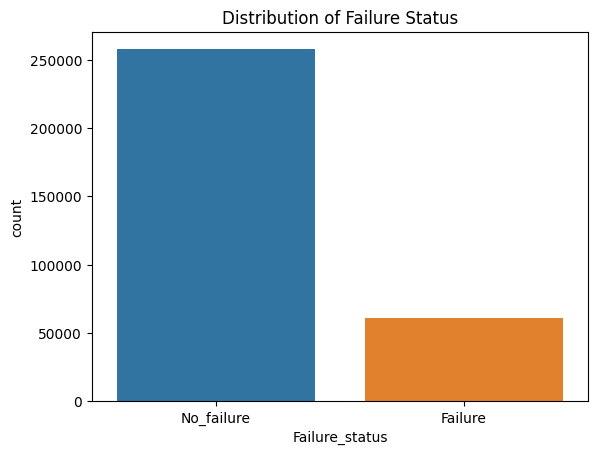

In [8]:
# Target Variable Distribution
sns.countplot(x='Failure_status', data=data)
plt.title('Distribution of Failure Status')
plt.show()




## Visual EDA

### Correlation Analysis

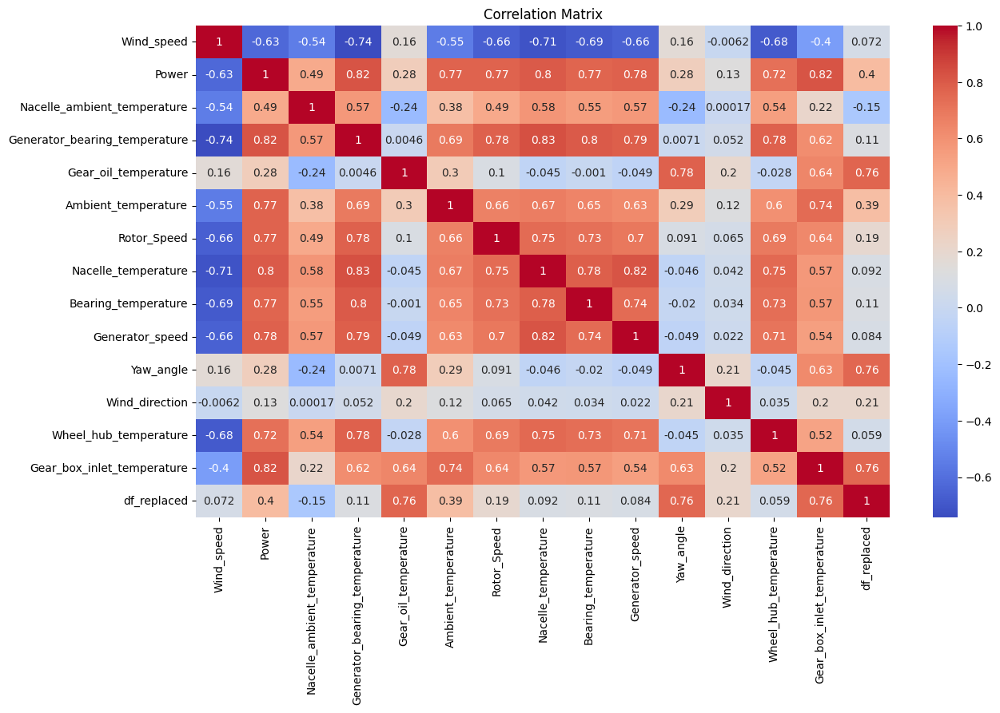

In [9]:
# Correlation Analysis
plt.figure(figsize=(14, 8))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()



### Univariate Analysis (Histograms for numerical variables)

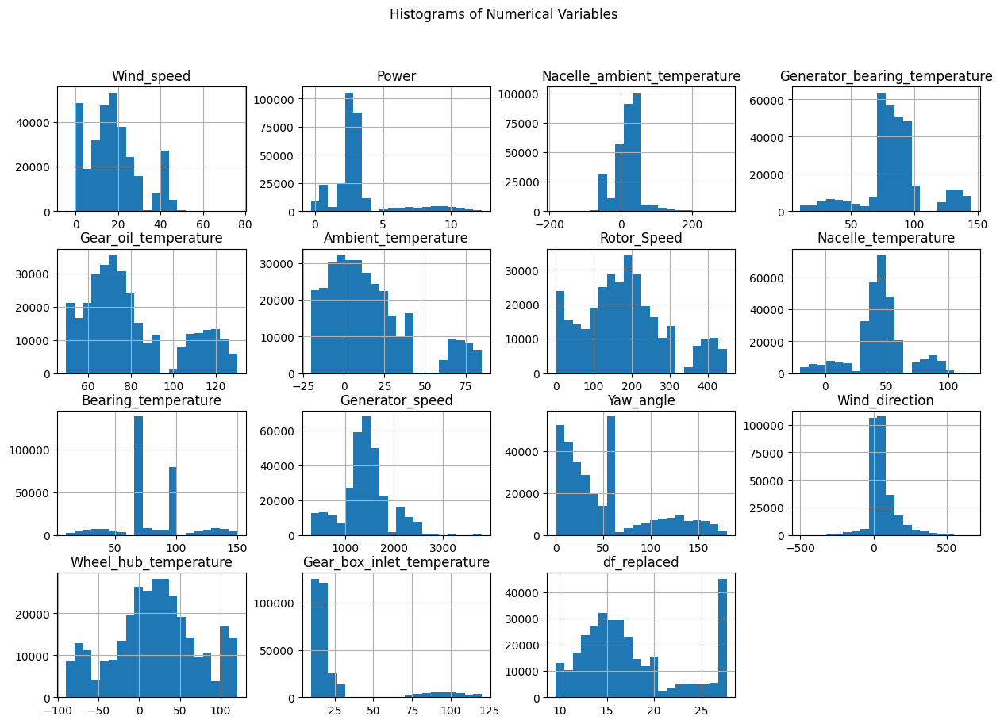

In [10]:
# Univariate Analysis (Histograms for numerical variables)
numerical_columns = data.select_dtypes(include=['float64']).columns
data[numerical_columns].hist(bins=20, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Variables')
plt.show()

### Outlier Detection (box plots)

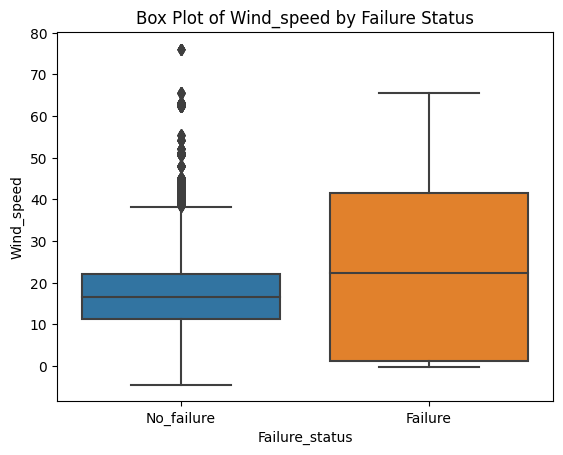

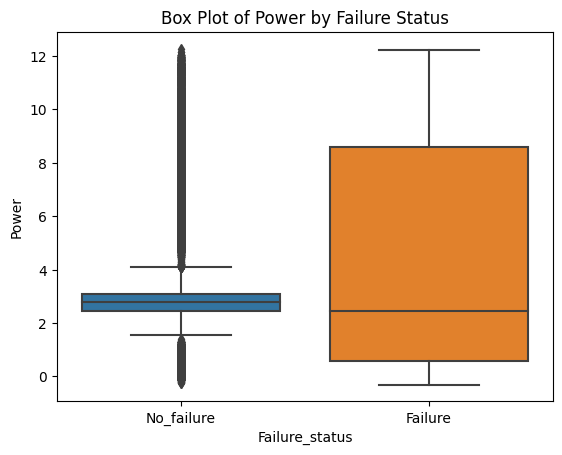

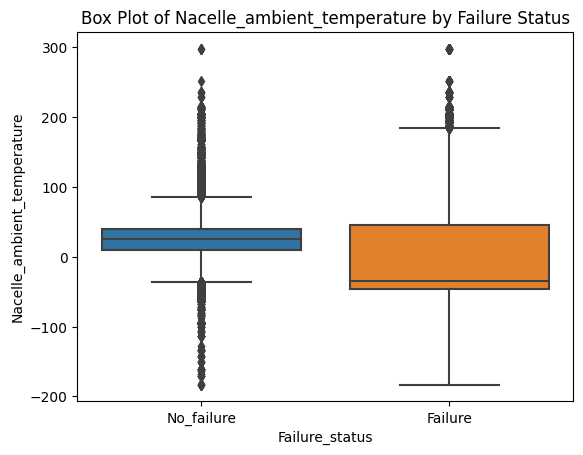

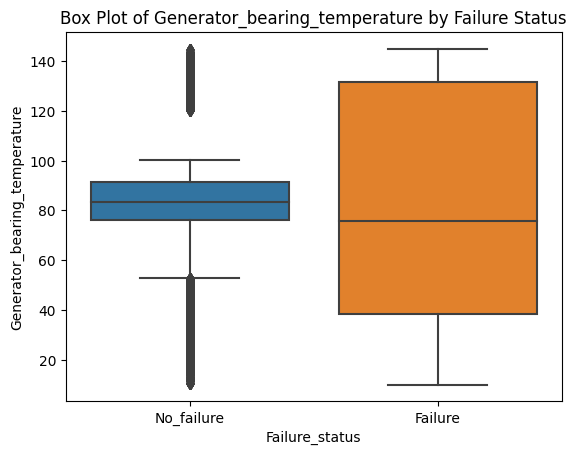

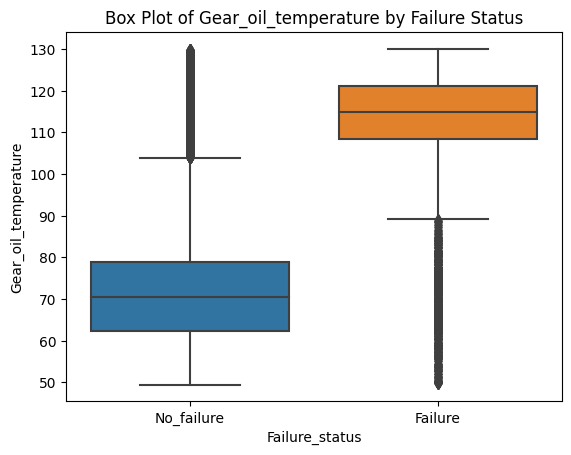

...

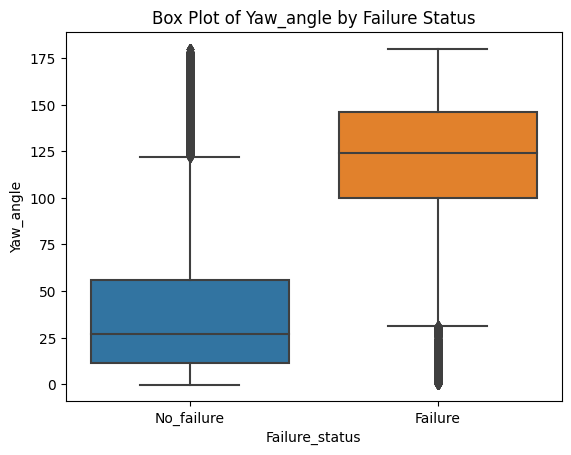

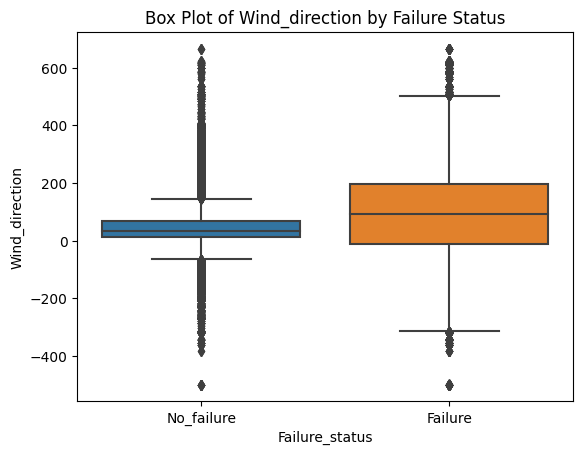

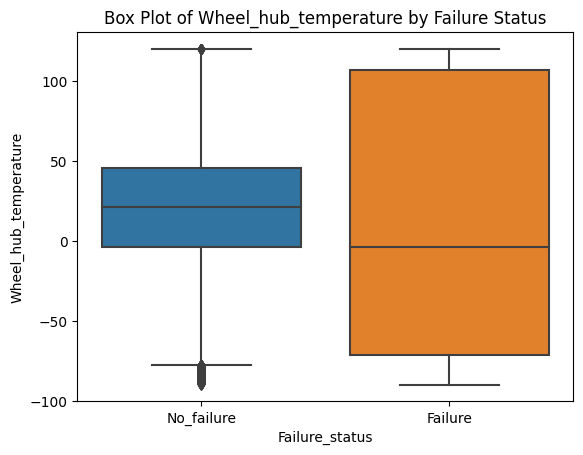

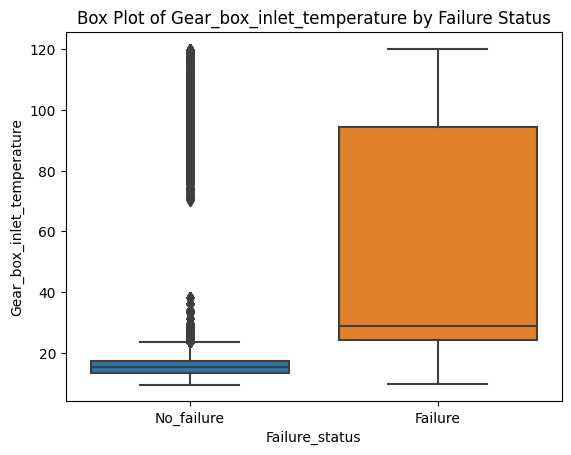

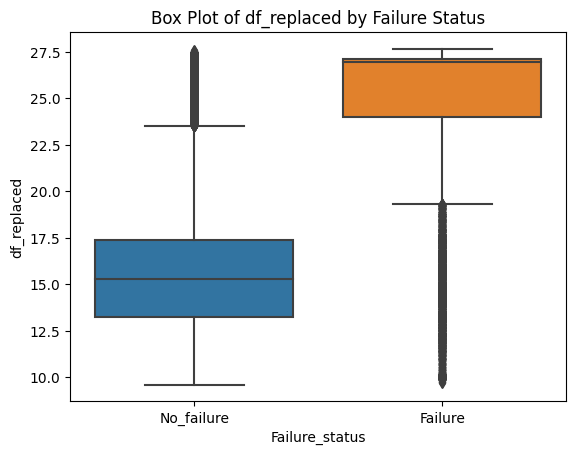

In [11]:
# Outlier Detection (box plots)
numerical_columns = data.select_dtypes(include=['float64']).columns
for column in numerical_columns:
    sns.boxplot(x='Failure_status', y=column, data=data)
    plt.title(f'Box Plot of {column} by Failure Status')
    plt.show()




### Distribution Plots

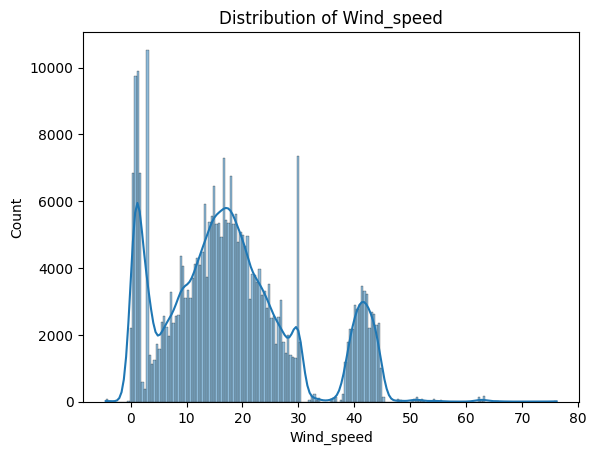

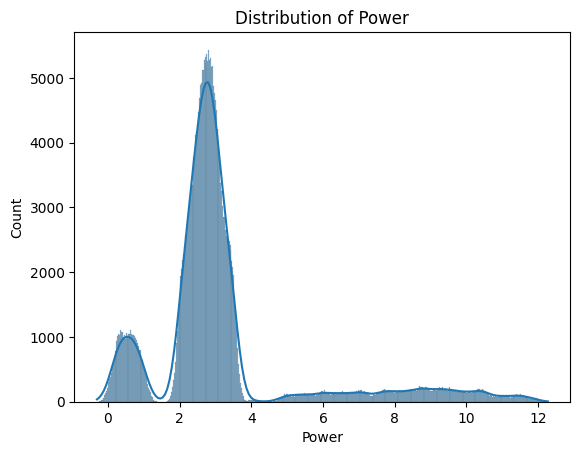

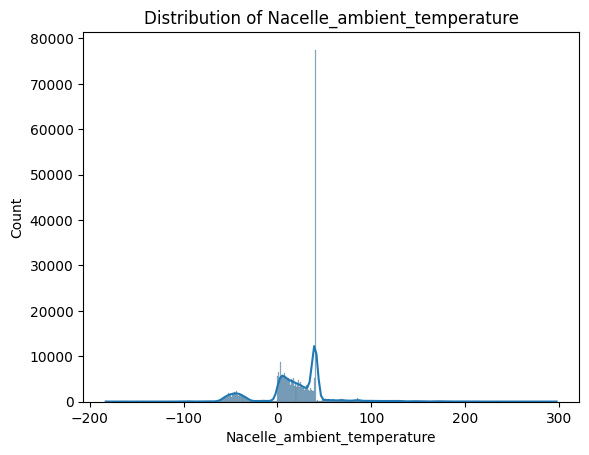

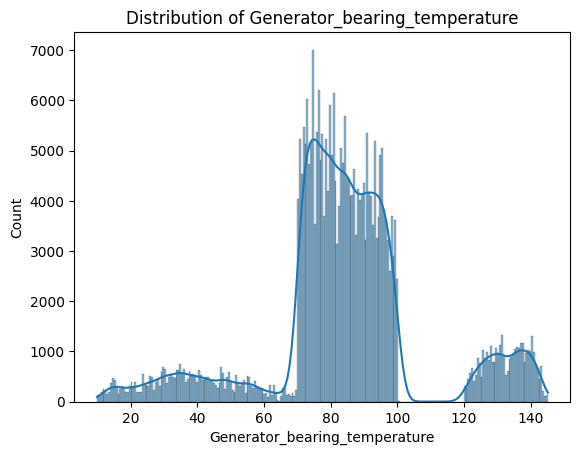

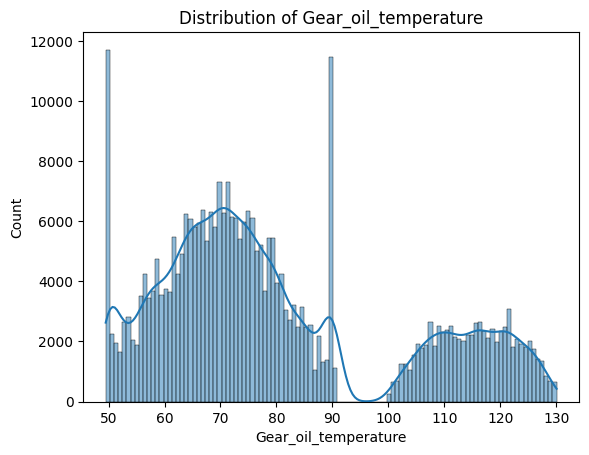

...

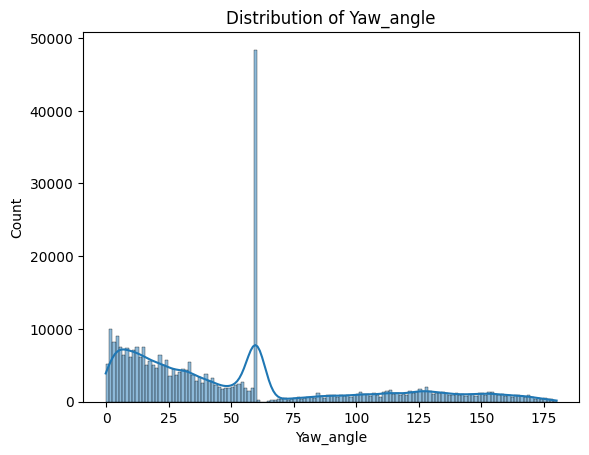

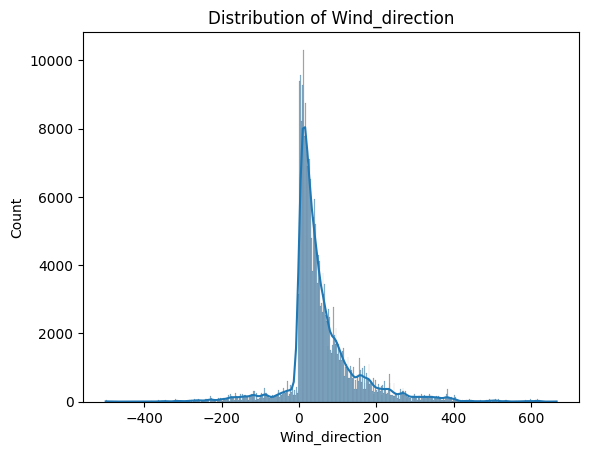

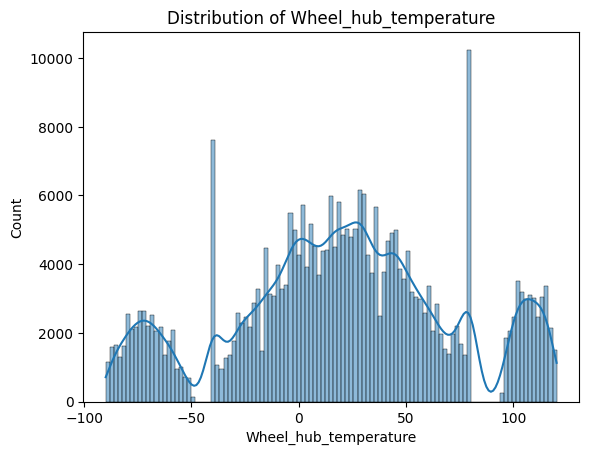

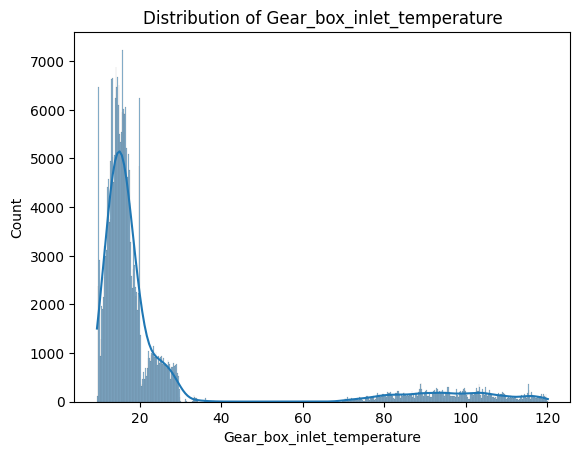

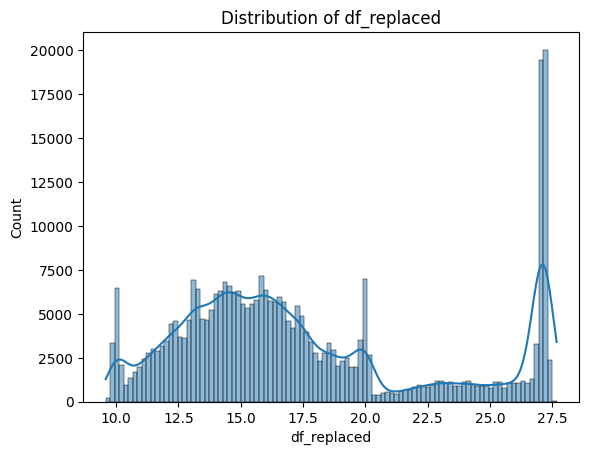

In [12]:
# Distribution Plots
for column in numerical_columns:
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()



### Feature Distributions by Target

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


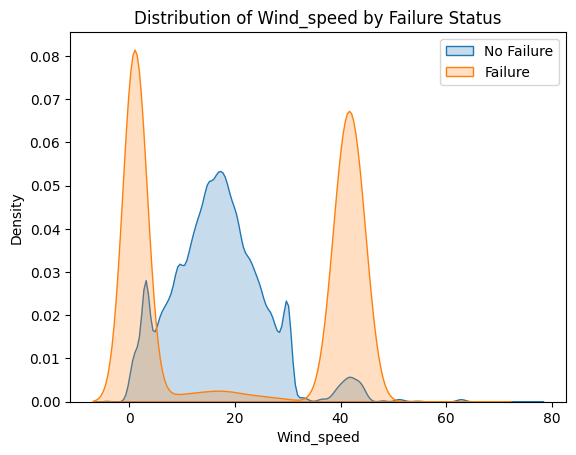

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


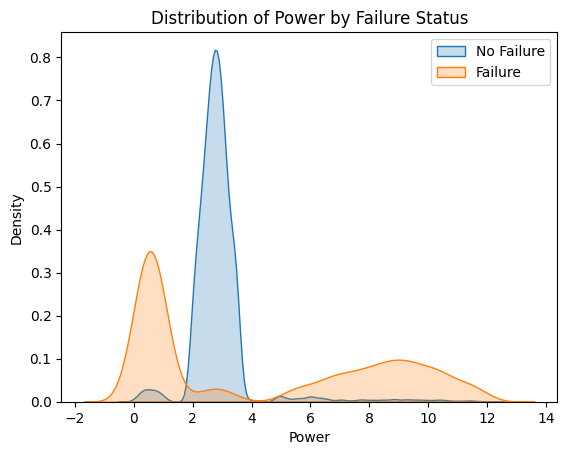

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


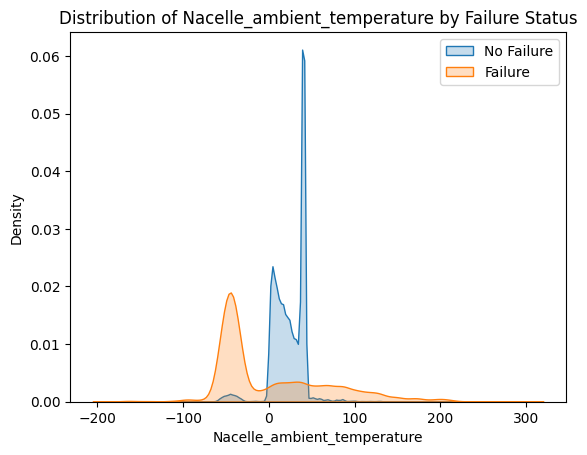

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


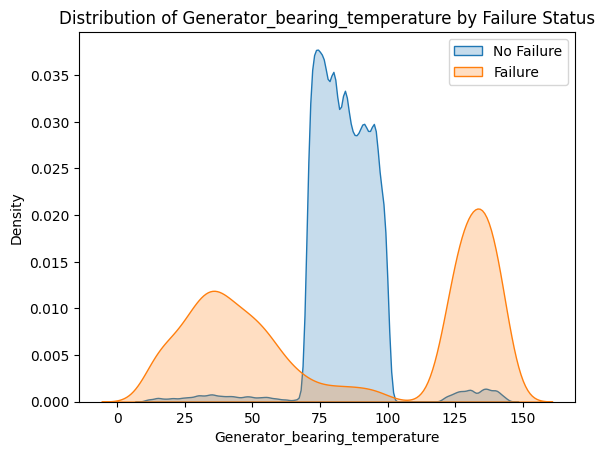

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


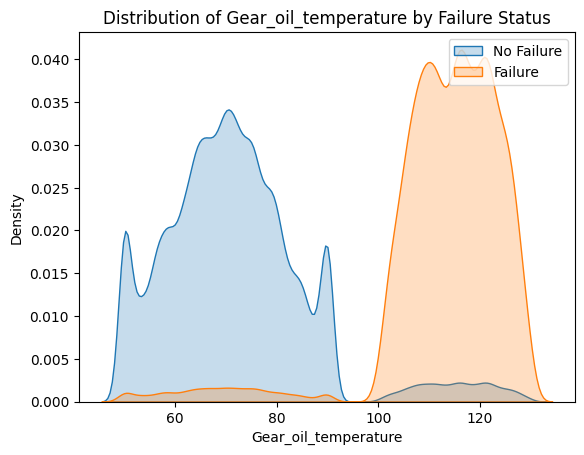

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


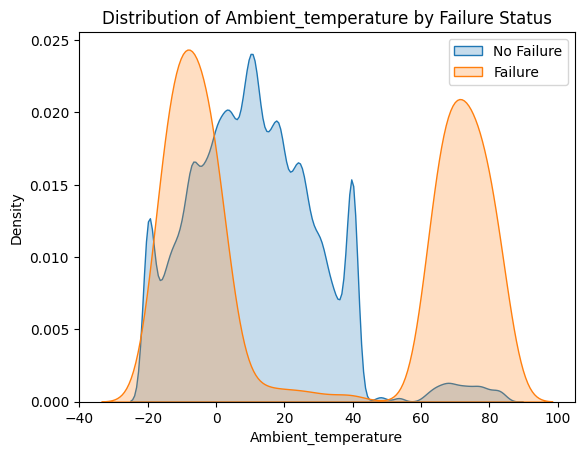

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


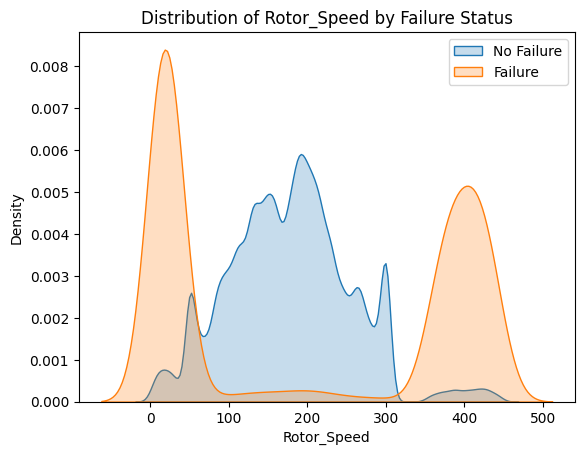

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


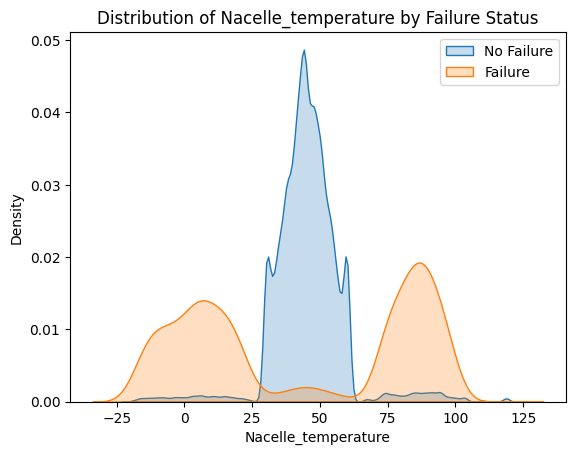

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


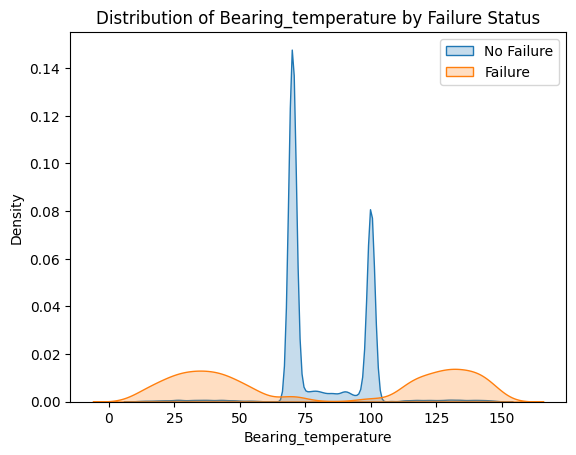

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


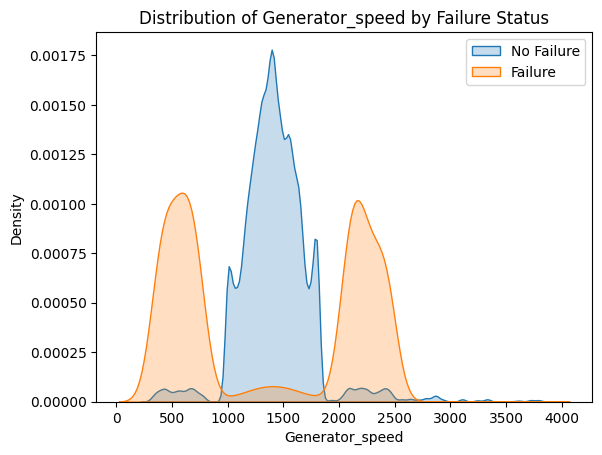

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


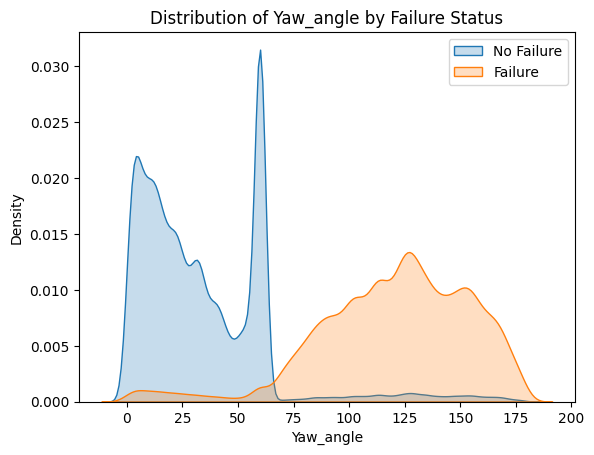

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


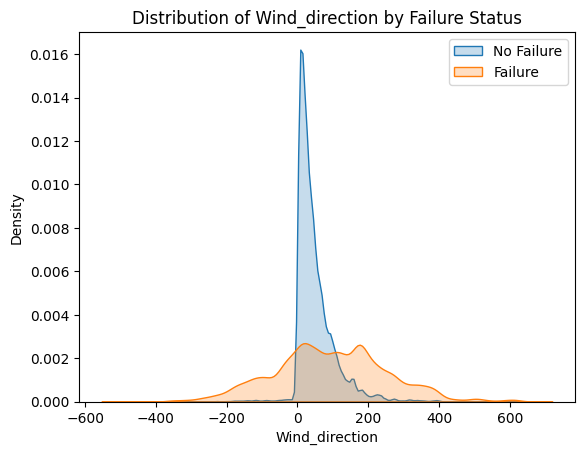

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


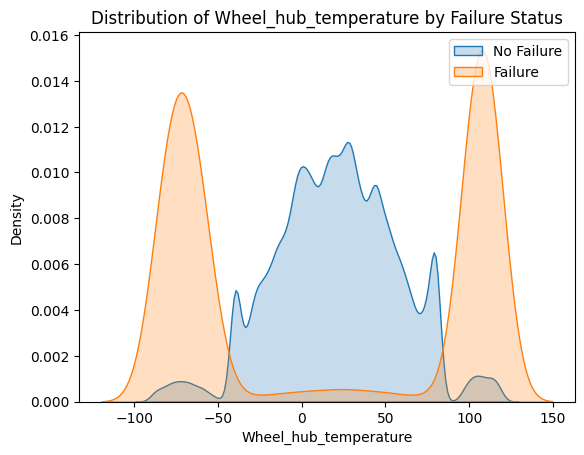

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


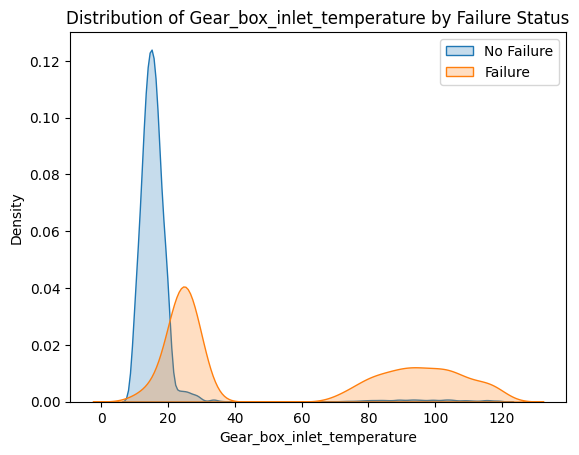

C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
C:\Users\jgdsh\AppData\Local\Temp\ipykernel_2844\2028912606.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)


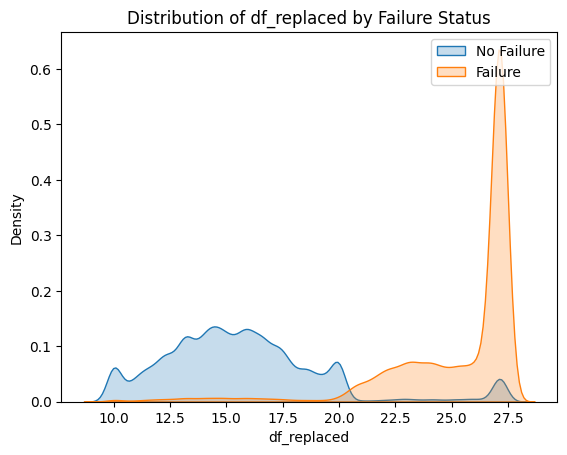

In [27]:
# Feature Distributions by Target
for column in numerical_columns:
    sns.kdeplot(data[data['Failure_status'] == 'No_failure'][column], label='No Failure', shade=True)
    sns.kdeplot(data[data['Failure_status'] == 'Failure'][column], label='Failure', shade=True)
    plt.title(f'Distribution of {column} by Failure Status')
    plt.legend()
    plt.show()

In [13]:
# Count the number of rows where Wind_speed is negative
negative_wind_speed_count = (data['Wind_speed'] < 0).sum()

print(f'Number of rows with negative Wind_speed: {negative_wind_speed_count}')


Number of rows with negative Wind_speed: 364


In [14]:
# Count the number of rows where Rotor_Speed is negative
negative_rotor_speed_count = (data['Rotor_Speed'] < 0).sum()

print(f'Number of rows with negative Rotor_Speed: {negative_rotor_speed_count}')


Number of rows with negative Rotor_Speed: 6


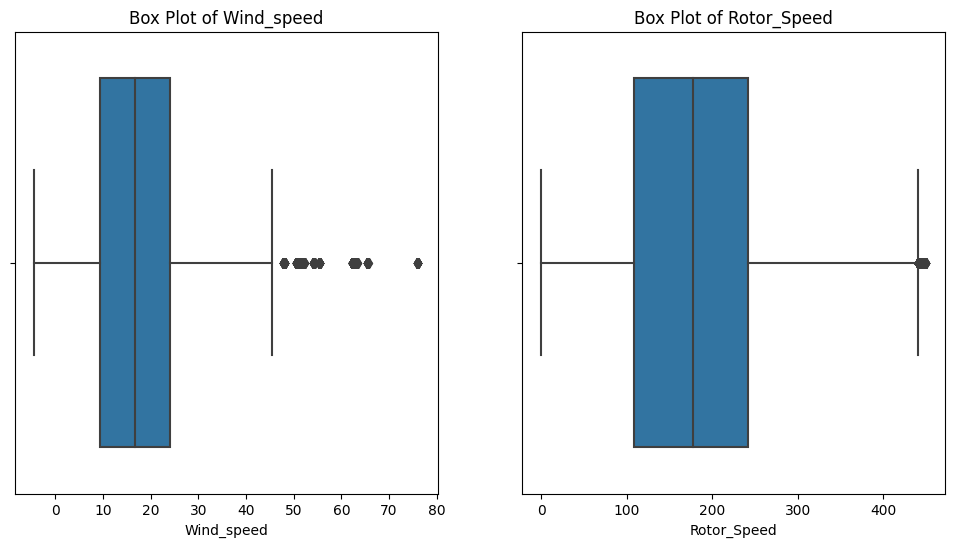

In [15]:
# Visualizing the distribution of Wind_speed and Rotor_Speed
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x='Wind_speed', data=data)
plt.title('Box Plot of Wind_speed')

plt.subplot(1, 2, 2)
sns.boxplot(x='Rotor_Speed', data=data)
plt.title('Box Plot of Rotor_Speed')

plt.show()

#### **Interpretation**

To determine if these values are outliers, it's essential to understand the context of the data and the physical limitations of the variables. In the case of wind speed and rotor speed, negative values might indicate errors in data collection or recording, as these variables are typically non-negative in physical systems.

Here are some considerations:

1. **Negative Wind Speed:**
   - Wind speed should generally be non-negative. Negative values might be an anomaly or an error in data recording. It's advisable to investigate these cases and, if possible, correct or remove the erroneous data points.

2. **Negative Rotor Speed:**
   - Rotor speed is also expected to be non-negative in typical wind turbine systems. Having negative values might be indicative of a measurement issue or an error. It's recommended to review the data collection process and potentially remove or correct these data points.



### Pair Plots

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


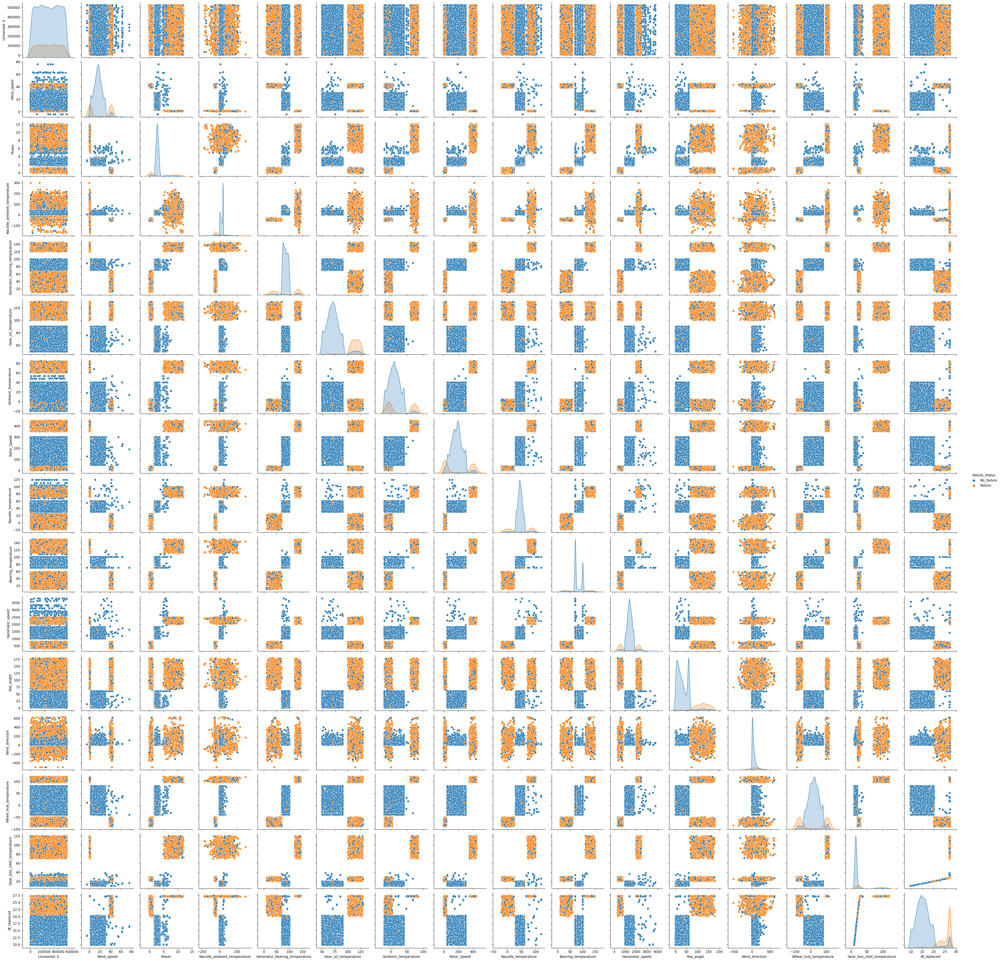

In [37]:
# takes more time to generate the plots, when plotted against all features

# variables_of_interest = ['Wind_speed', 'Power', 'Nacelle_ambient_temperature', 'Generator_bearing_temperature', 'Gear_box_inlet_temperature', 'Rotor_Speed', 'Failure_status']
# sns.pairplot(data.sample(frac=0.1), hue='Failure_status')
# plt.show()


c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



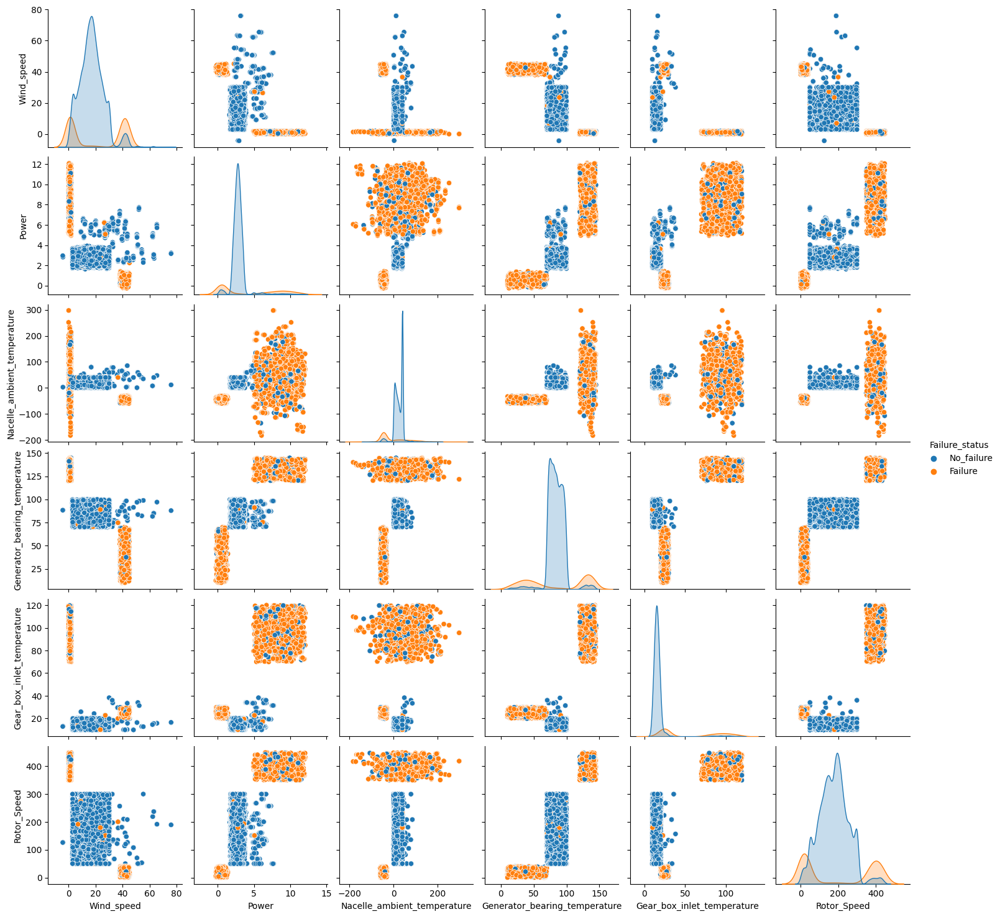

In [16]:
# pairwise for a subset of featues and a fraction(10%) of data

variables_of_interest = ['Wind_speed', 'Power', 'Nacelle_ambient_temperature', 'Generator_bearing_temperature', 'Gear_box_inlet_temperature', 'Rotor_Speed', 'Failure_status']
subset_data = data[variables_of_interest].sample(frac=0.1)
sns.pairplot(subset_data, hue='Failure_status')
plt.show()


While there is observable differentiation between the **'Failure'** and **'No_Failure'** categories in the pairwise plot, it's important to note that the plot is based on only 10% of the entire dataset. Additionally, we specifically chose a subset of features that we deem significant for this analysis.

## Feature Engineering

### Handling Missing Values

In [17]:
len(data)

330722

In [41]:
# data_cleaned = data.dropna()

# # Verify if there are still missing values
# updated_missing_values = data_cleaned.isnull().sum()
# print(updated_missing_values)

# # Now 'data_cleaned' does not contain any rows with missing values


Unnamed: 0                       0
Wind_speed                       0
Power                            0
Nacelle_ambient_temperature      0
Generator_bearing_temperature    0
Gear_oil_temperature             0
Ambient_temperature              0
Rotor_Speed                      0
Nacelle_temperature              0
Bearing_temperature              0
Generator_speed                  0
Yaw_angle                        0
Wind_direction                   0
Wheel_hub_temperature            0
Gear_box_inlet_temperature       0
Failure_status                   0
df_replaced                      0
dtype: int64


In [18]:
missing_values = data.isnull().sum()

# Replacing missing values with the mean, for the numerical data
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
data[numerical_columns] = data[numerical_columns].fillna(data[numerical_columns].mean())

updated_missing_values = data.isnull().sum()
print(updated_missing_values)
print('################################')
# Just drop the NA values for the Target
data.dropna(subset=['Failure_status'], inplace=True)

# updated_missing_values = data.isnull().sum()
# print(updated_missing_values)


Wind_speed                           0
Power                                0
Nacelle_ambient_temperature          0
Generator_bearing_temperature        0
Gear_oil_temperature                 0
Ambient_temperature                  0
Rotor_Speed                          0
Nacelle_temperature                  0
Bearing_temperature                  0
Generator_speed                      0
Yaw_angle                            0
Wind_direction                       0
Wheel_hub_temperature                0
Gear_box_inlet_temperature           0
Failure_status                   12032
df_replaced                          0
dtype: int64
################################


In [24]:
updated_missing_values = data.isnull().sum()
print(updated_missing_values)


Wind_speed                       0
Power                            0
Nacelle_ambient_temperature      0
Generator_bearing_temperature    0
Gear_oil_temperature             0
Ambient_temperature              0
Rotor_Speed                      0
Nacelle_temperature              0
Bearing_temperature              0
Generator_speed                  0
Yaw_angle                        0
Wind_direction                   0
Wheel_hub_temperature            0
Gear_box_inlet_temperature       0
Failure_status                   0
df_replaced                      0
dtype: int64


In [19]:
# Categorical target into 0 or 1
data['Failure_status'] = data['Failure_status'].map({'Failure': 1, 'No_failure': 0})

In [20]:
X = data.drop("Failure_status", axis=1)
Y = data["Failure_status"]

In [9]:
# # RESAMPLING TO HANDLE IMBALANCED DATA
# from imblearn.over_sampling import RandomOverSampler
# ros = RandomOverSampler(random_state=0)
# X_resampled, Y_resampled = ros.fit_resample(X, Y)
# X.value_counts()
# Y.value_counts() 

In [21]:

# MODEL BUILDING
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

# Initialize the Naive Bayes classifier
nb_classifier = GaussianNB()

# Fit the classifier on the training data
nb_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Classification Report:\n{classification_rep}')


Accuracy: 0.9457675693202381
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     77124
           1       0.80      0.95      0.87     18483

    accuracy                           0.95     95607
   macro avg       0.90      0.95      0.92     95607
weighted avg       0.95      0.95      0.95     95607



In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# # Separate features and target variable
# X = data.drop(['Failure_status'], axis=1)
# y = data['Failure_status']

# # Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors

# Train the classifier
knn_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = knn_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9435344692334243
Confusion Matrix:
[[48860  2432]
 [ 1167 11279]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96     51292
           1       0.82      0.91      0.86     12446

    accuracy                           0.94     63738
   macro avg       0.90      0.93      0.91     63738
weighted avg       0.95      0.94      0.94     63738



In [13]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature and target arrays

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the SVM classifier
svm_classifier = SVC(kernel='linear')  # You can choose different kernels like 'linear', 'rbf', 'poly', etc.

# Train the classifier
svm_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


In [26]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature and target arrays

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the Decision Tree classifier
tree_classifier = DecisionTreeClassifier(max_depth=None)  # You can set max_depth and other parameters

# Train the classifier
tree_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = tree_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9102576171200853
Confusion Matrix:
[[48611  2681]
 [ 3039  9407]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.94     51292
           1       0.78      0.76      0.77     12446

    accuracy                           0.91     63738
   macro avg       0.86      0.85      0.86     63738
weighted avg       0.91      0.91      0.91     63738



In [27]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature and target arrays

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)  # You can adjust the number of estimators and other parameters

# Train the classifier
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9481314129718535
Confusion Matrix:
[[48783  2509]
 [  797 11649]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97     51292
           1       0.82      0.94      0.88     12446

    accuracy                           0.95     63738
   macro avg       0.90      0.94      0.92     63738
weighted avg       0.95      0.95      0.95     63738



In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature and target arrays

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the Logistic Regression classifier
logreg_classifier = LogisticRegression(random_state=42)  # You can adjust parameters as needed

# Train the classifier
logreg_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9404750698170636
Confusion Matrix:
[[48902  2390]
 [ 1404 11042]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     51292
           1       0.82      0.89      0.85     12446

    accuracy                           0.94     63738
   macro avg       0.90      0.92      0.91     63738
weighted avg       0.94      0.94      0.94     63738



c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



##### Min Max scaling later

- remember to include the run times for each algorithm,
- SVM takes the longest.
- Hyperparameter Tuning Parameters - Required

- Basic GridSearch CV is good..!?


### Training on Min Max Scaled Data

In [29]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Assuming X and Y are your feature and target arrays

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform both the training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Now, X_train_scaled and X_test_scaled are the scaled feature sets that you can use in your machine learning models


In [30]:
# Initialize the Naive Bayes classifier
nb_classifier = GaussianNB()

# Fit the classifier on the scaled training data
nb_classifier.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred = nb_classifier.predict(X_test_scaled)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Classification Report:\n{classification_rep}')


Accuracy: 0.9456525149832126
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     51292
           1       0.81      0.95      0.87     12446

    accuracy                           0.95     63738
   macro avg       0.90      0.95      0.92     63738
weighted avg       0.95      0.95      0.95     63738



In [31]:

# Initialize KNN classifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors

# Train the classifier
knn_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = knn_classifier.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9428755216668235
Confusion Matrix:
[[48860  2432]
 [ 1209 11237]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96     51292
           1       0.82      0.90      0.86     12446

    accuracy                           0.94     63738
   macro avg       0.90      0.93      0.91     63738
weighted avg       0.95      0.94      0.94     63738



In [32]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)  # You can adjust the number of estimators and other parameters

# Train the classifier
rf_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



Accuracy: 0.8047318710973046
Confusion Matrix:
[[51292     0]
 [12446     0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     51292
           1       0.00      0.00      0.00     12446

    accuracy                           0.80     63738
   macro avg       0.40      0.50      0.45     63738
weighted avg       0.65      0.80      0.72     63738



c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [34]:
# Initialize the Logistic Regression classifier
logreg_classifier = LogisticRegression(random_state=42)  # You can adjust parameters as needed

# Train the classifier
logreg_classifier.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = logreg_classifier.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


Accuracy: 0.9469860993441903
Confusion Matrix:
[[48804  2488]
 [  891 11555]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97     51292
           1       0.82      0.93      0.87     12446

    accuracy                           0.95     63738
   macro avg       0.90      0.94      0.92     63738
weighted avg       0.95      0.95      0.95     63738



### Hyper Param Tuning - KNN

In [35]:

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

knn_classifier = KNeighborsClassifier()

# Define the hyperparameters and their possible values
param_grid = {'n_neighbors': [2, 3, 4, 5, 7]}  # You can extend the list of values

# Initialize GridSearchCV
grid_search = GridSearchCV(knn_classifier, param_grid, cv=5, scoring='accuracy')

# Fit the grid search on the scaled training data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Make predictions on the scaled test data using the best model
y_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Classification Report:\n{classification_rep}')


Best Hyperparameters: {'n_neighbors': 7}
Accuracy: 0.9470802347108476
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97     51292
           1       0.82      0.93      0.87     12446

    accuracy                           0.95     63738
   macro avg       0.90      0.94      0.92     63738
weighted avg       0.95      0.95      0.95     63738



In [ ]:

knn_classifier = KNeighborsClassifier(n_neighbors=3)  # You can adjust the number of neighbors

# Train the classifier
knn_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = knn_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{classification_rep}")


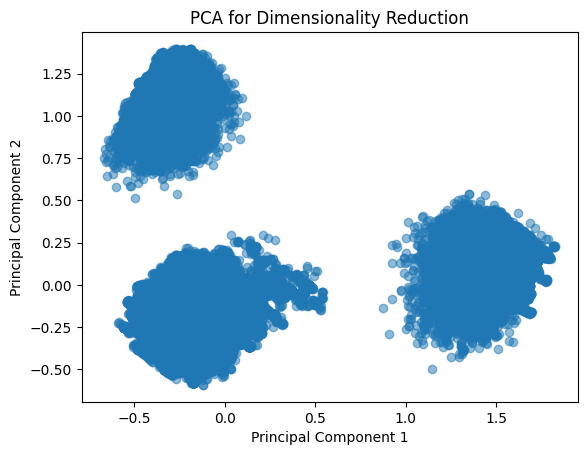

In [36]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assuming data is your DataFrame with features
# You might need to handle missing values and encode categorical variables if needed


X_scaled = scaler.fit_transform(X)

# Applying PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Visualizing the reduced data
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA for Dimensionality Reduction')
plt.show()


In [ ]:
from sklearn.cluster import KMeans

n_clusters = 3  # You can choose the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)

# Fit the KMeans model
kmeans.fit(X)

# Get the cluster assignments for each data point
labels = kmeans.labels_

# Use PCA for dimensionality reduction to visualize the clusters in 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create a DataFrame with the original features, PCA components, and cluster labels
df_clusters = pd.DataFrame({'PCA1': X_pca[:, 0], 'PCA2': X_pca[:, 1], 'Cluster': labels})

# Visualize the clusters in 2D
plt.figure(figsize=(8, 6))
scatter = plt.scatter(df_clusters['PCA1'], df_clusters['PCA2'], c=df_clusters['Cluster'], cmap='viridis')
plt.title('K-Means Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(*scatter.legend_elements(), title='Clusters')
plt.show()


c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\jgdsh\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the w

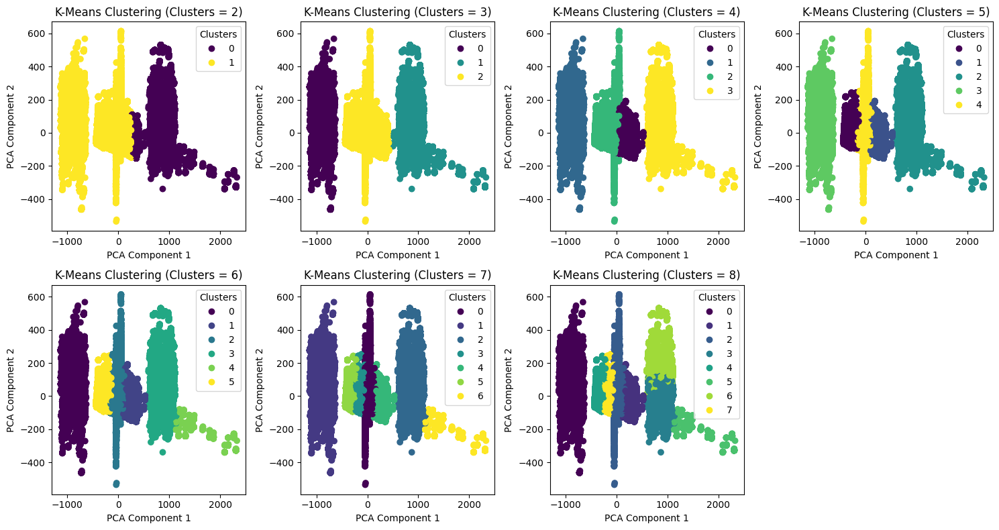

In [39]:
from sklearn.cluster import KMeans

cluster_range = range(2, 9)  # Experimenting with 2 to 6 clusters

# Visualize clusters for different numbers of clusters
plt.figure(figsize=(15, 8))

for i, n_clusters in enumerate(cluster_range, 1):
    # Initialize the KMeans model with the current number of clusters
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)

    # Fit the KMeans model
    kmeans.fit(X)

    # Get the cluster assignments for each data point
    labels = kmeans.labels_

    # Use PCA for dimensionality reduction to visualize the clusters in 2D
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Create a DataFrame with the original features, PCA components, and cluster labels
    df_clusters = pd.DataFrame({'PCA1': X_pca[:, 0], 'PCA2': X_pca[:, 1], 'Cluster': labels})

    # Plot each cluster in a separate subplot
    plt.subplot(2, 4, i)
    scatter = plt.scatter(df_clusters['PCA1'], df_clusters['PCA2'], c=df_clusters['Cluster'], cmap='viridis')
    plt.title(f'K-Means Clustering (Clusters = {n_clusters})')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend(*scatter.legend_elements(), title='Clusters')

plt.tight_layout()
plt.show()
